<a href="https://colab.research.google.com/github/nth-zik/ai-program-k32/blob/main/cau2_giaithuat2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Câu 2 - Sử dụng Transfer learning

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pandas as pd
from glob import glob
import sklearn.metrics as metrics
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import VGG16


In [30]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
import pathlib

dataset_url = "/content/drive/MyDrive/Landmark_Classification"
data_dir = pathlib.Path(dataset_url)

In [32]:
image_count = len(list(data_dir.glob('**/*.jpg')))
print(image_count)

3000


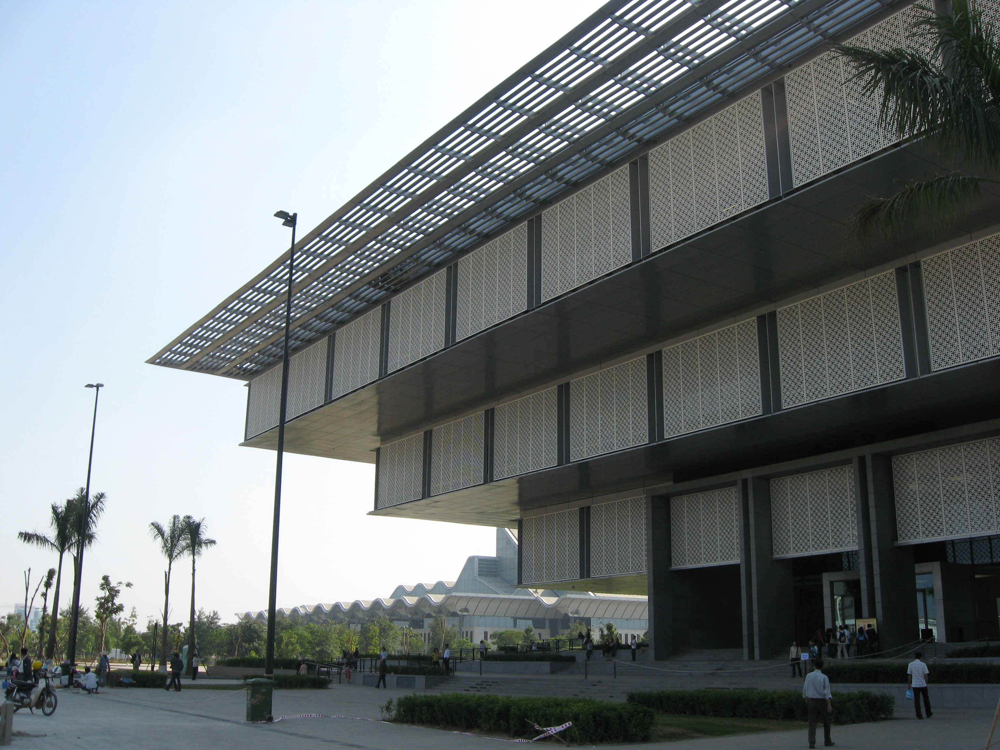

In [33]:
hanoimuseum = list(data_dir.glob('train/bao_tang_ha_noi/*'))
PIL.Image.open(str(hanoimuseum[0]))

In [34]:
batch_size = 64
img_height = 224
img_width = 224

In [35]:
data_dir_train = pathlib.Path('%s/train' % data_dir).with_suffix('')
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1500 files belonging to 30 classes.
Using 1200 files for training.


In [36]:
class_names = train_ds.class_names
num_classes = len(class_names)

print(class_names)

['bao_tang_ha_noi', 'buu_dien_trung_tam_tphcm', 'cau_long_bien', 'cau_nhat_tan', 'cau_rong', 'cho_ben_thanh_tphcm', 'chua_cau', 'chua_mot_cot', 'chua_thien_mu', 'cot_co', 'hoang_thanh', 'hon_chong_nhatrang', 'landmark81', 'lang_bac', 'lang_khai_dinh', 'mui_ca_mau', 'mui_ke_ga_phanthiet', 'nha_hat_lon_hanoi', 'nha_hat_lon_tphcm', 'nha_tho_da_co_sapa', 'nha_tho_lon_ha_noi', 'quang_truong_lam_vien', 'suoi_tien_tphcm', 'thac_ban_gioc', 'thap_cham', 'thap_rua', 'toa_nha_bitexco_tphcm', 'tuong_chua_kito_vungtau', 'ubnd_tphcm', 'van_mieu']


In [62]:
from tensorflow.keras.applications import resnet50
from tensorflow.keras import models

# initializing model with weights='imagenet'i.e. we are carring its original weights
model_resnet=resnet50.ResNet50(weights='imagenet')

input_layer=layers.Input(shape=(224,224,3))

resnet_model=resnet50.ResNet50(weights='imagenet',input_tensor=input_layer,include_top=False)

resnet_model.summary()


last_layer=resnet_model.output
flatten=layers.Flatten()(last_layer) 

output_layer=layers.Dense(num_classes,activation='softmax')(flatten)

model=models.Model(inputs=input_layer,outputs=output_layer)

for layer in model.layers[:-1]:
    layer.trainable=False
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_18[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [63]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [59]:
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input

trdata = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

train_data_gen = trdata.flow_from_directory(directory='%s/train' % data_dir,target_size=(224,224),shuffle=False, class_mode='categorical', subset='training')
test_data_gen = trdata.flow_from_directory(directory='%s/train' % data_dir, target_size=(224,224),shuffle=False, class_mode='categorical', subset='validation')

Found 1200 images belonging to 30 classes.
Found 300 images belonging to 30 classes.


In [64]:
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from datetime import datetime

start_time = datetime.now()

epochs = 5

model.fit(train_data_gen,epochs=epochs,batch_size=64, validation_data=test_data_gen, verbose=1)
end_time = datetime.now()
print('Training Completed! Time: %s' % (end_time - start_time).total_seconds())

Epoch 1/5
38/38 [==============================] - ETA: 0s - loss: 120.5645 - accuracy: 0.1033

/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


38/38 [==============================] - 336s 9s/step - loss: 120.5645 - accuracy: 0.1033 - val_loss: 23.2442 - val_accuracy: 0.4367
Epoch 2/5
38/38 [==============================] - 319s 8s/step - loss: 14.8423 - accuracy: 0.6383 - val_loss: 11.8975 - val_accuracy: 0.6800
Epoch 3/5
38/38 [==============================] - 334s 9s/step - loss: 2.3911 - accuracy: 0.9258 - val_loss: 4.8852 - val_accuracy: 0.8500
Epoch 4/5
38/38 [==============================] - 342s 9s/step - loss: 0.0131 - accuracy: 0.9967 - val_loss: 4.4928 - val_accuracy: 0.8700
Epoch 5/5
38/38 [==============================] - 334s 9s/step - loss: 1.9471e-08 - accuracy: 1.0000 - val_loss: 4.5311 - val_accuracy: 0.8667
Training Completed! Time: 1822.135999


In [66]:
from sklearn.metrics import accuracy_score

data_dir_test_path = pathlib.Path('%s/test' % data_dir).with_suffix('')
test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_test_path,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

predictions = []
labels = []
for x, y in test_ds:
    predictions.append(np.argmax(model(x), axis=-1))
    labels.append(y.numpy())

predictions = np.concatenate(predictions, axis=0)
labels = np.concatenate(labels, axis=0)

accuracy_score(labels, predictions)

Found 1500 files belonging to 30 classes.


0.716

# Kiểm tra ngẫu nhiên một vài hình

Hiển thị cho dê nhìn, và tự kiểm tra lại mô hình

In [79]:
def my_predict(img_name):
    img=tf.keras.utils.load_img(img_name,target_size=(img_height, img_width))
    img=tf.keras.utils.img_to_array(img)
    img=resnet50.preprocess_input(img)
    prediction=model.predict(img.reshape(1,img_height, img_width,3))
    score = tf.nn.softmax(prediction[0])

    output=np.argmax(prediction)
    return (
      "Đoán {} điểm {:.2f}%."
      .format(class_names[output],  100 * np.max(score))
    )

1/1 [==============================] - 0s 197ms/step


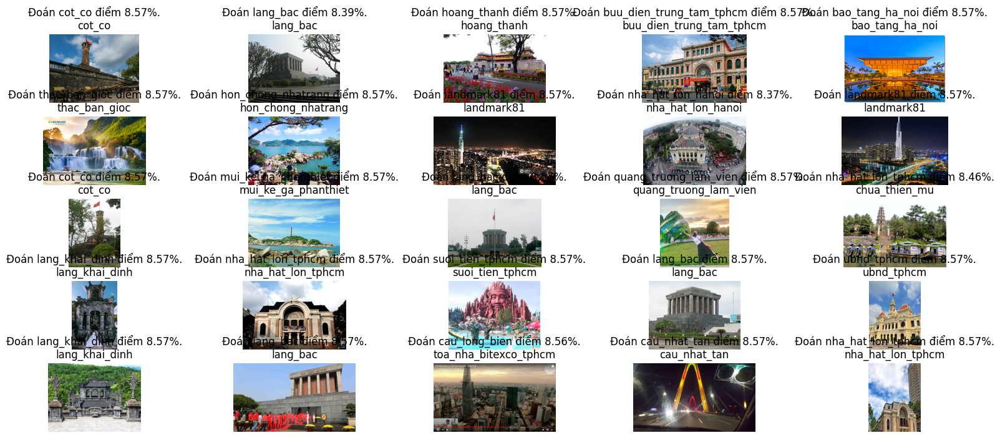

In [82]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# Lấy hình trong tập test và chọn ngẫu nhiên 25 tấm
raw_images = glob.glob('/content/drive/MyDrive/Landmark_Classification/test/**/*.jpg')
raw_images = random.sample(raw_images, 25)

images = []
for img_path in raw_images:
    images.append({ 'img': mpimg.imread(img_path), 'path': img_path, 'label': img_path.split('/')[-2] })
fig = plt.figure(figsize=(20,10))
columns = 5
fig.tight_layout()
for i, image in enumerate(images):
    plt.subplot(int(len(images) / columns) + 1, columns, i + 1)
    plt.title('%s\n%s' % (my_predict(image['path']), image['label']))
    plt.imshow(image['img'])
    plt.axis("off")

In [ ]:
model.save('/content/drive/MyDrive/LapTrinhTTNT/cau2_modelTransfer.h5')